# Robert Half Data Challenge

## Task

__Timeline:__ <br> 3 days (should take 3-5 hours)

__Objective:__<br> This challenge aims to evaluate your problem-solving skills and ability to create, verify, and clarify intricate data models by identifying the right solution.

__Scope:__
<br>
This exercise is challenging in data science, so show us your skills!
Stretch your analytical abilities and inspire innovative problem-solving. The challenge will provide you with a complex CSV dataset packed with features and potential for exploration.

__Data Understanding:__
<br>
Familiarize yourself with the dataset and interpret the significance of each column.

__Feature Engineering:__
<br>
How would you create new features from the existing ones to better capture the underlying patterns in the data?

__Feature Importance:__
<br>
Identify the essential features in the dataset. What makes these features significant? How do they influence the outcome variable?

__Model Building and Evaluation:__
<br>
Build a predictive model using the dataset predicting the label. Which model did you choose and why? How well does your model perform?

__Communication:__
<br>Describe your process and findings clearly and understandably. Are you able to simplify complex data science concepts into everyday language?

### Imports

In [1]:
import warnings

warnings.filterwarnings("ignore")

In [2]:
from IPython.display import Image
from typing import List, Optional, Tuple

import lightgbm as lgb
import matplotlib.pylab as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, make_scorer
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

### Functions

In [3]:
def count_nans(df: pd.DataFrame) -> pd.DataFrame:
    df_len = df.shape[0]
    nan_cnt = [df[col].isna().sum() for col in df.columns]
    nan_ratio = [x / df_len for x in nan_cnt]
    return pd.DataFrame({"colname": df.columns, "nan_cnt": nan_cnt, "nan_ratio": nan_ratio})


def calc_distinct_values(df: pd.DataFrame, cols: Optional[List[str]] = None) -> pd.DataFrame:
    if not cols:
        cols = df.columns
    distinct_cnt = [df[col].unique().shape[0] for col in cols]
    return pd.DataFrame({"colname": cols, "distinct_cnt": distinct_cnt})


def calc_feature_is_int(data: pd.DataFrame, feature: str) -> pd.DataFrame:
    data[f'{feature}_is_int'] = data[feature].map(lambda x: x.is_integer()).map(int)
    return data


def calc_feature_is_pos(data: pd.DataFrame, feature: str) -> pd.DataFrame:
    data[f'{feature}_is_pos'] = data[feature].map(lambda x: x >= 0).map(int)
    return data


def calc_feature_eq_val(data: pd.DataFrame, feature: str, val: float) -> pd.DataFrame:
    data[f'{feature}__eq_{val}'] = (data[feature] == val).map(int)
    return data


def calc_feature_between_vals(data: pd.DataFrame, feature: str, left: float, right: float) -> pd.DataFrame:
    data[f'{feature}__between_{left}_{right}'] = ((data[feature] > left) & (data[feature] < right)).map(int)
    return data


def calc_feature_out_bounds(data: pd.DataFrame, feature: str, left: float, right: float) -> pd.DataFrame:
    data[f'{feature}__out_{left}_{right}'] = ((data[feature] < left) | (data[feature] > right)).map(int)
    return data

def calc_sq_features(data: pd.DataFrame, features: List[str]) -> pd.DataFrame:
    for col in features:
        data[f'{col}__sq'] = data[col] ** 2
    return data


def calc_mult_features(data: pd.DataFrame, features: List[str]) -> pd.DataFrame:
    n = len(features)
    for i in range(n-1):
        for j in range(i+1, n):
            data[f'mult__{features[i]}__{features[j]}'] = data[features[i]] * data[features[j]]

    return data


def select_features_by_corr(data: pd.DataFrame, features: List[str], target: str, top=.9) -> List[str]:
    n = int(len(features) * top)
    top_n = data[features+[target]].corr().abs()[target].sort_values(ascending=False)[1:n+1]
    top_n = top_n.to_dict().keys()
    return list(top_n)


def plot_ecdf(
    data: pd.DataFrame,
    feature: str,
    target: str,
    figsize: Tuple[int, int] = (5, 3),
    title: str = 'ecdf',
):
    xs_neg = data[data[target] == 0][feature].values
    xs_pos = data[data[target] == 1][feature].values

    xs_neg, ys_neg = np.sort(xs_neg), np.arange(1, len(xs_neg)+1) / len(xs_neg)
    xs_pos, ys_pos = np.sort(xs_pos), np.arange(1, len(xs_pos)+1) / len(xs_pos)

    plt.figure(figsize=figsize)
    plt.scatter(xs_neg, ys_neg)
    plt.scatter(xs_pos, ys_pos, color='orange')
    plt.grid()
    plt.title(title)
    plt.show()


def plot_feature_importance_weight(
    booster,
    importance_type="gain",
    figsize=(7, 3),
    title="Feature importance",
    xlabel="gain weight",
    ylabel="feature",
    top_n=None,
):
    importance = booster.feature_importance(importance_type=importance_type)
    feature_name = booster.feature_name()
    importance /= importance.sum()
    tuples = sorted(zip(feature_name, importance), key=lambda x: -x[1])
    xs = [x[1] for x in tuples]
    ys = [x[0] for x in tuples]
    if top_n:
        xs = xs[:top_n]
        ys = ys[:top_n]

    plt.figure(figsize=figsize)
    sns.barplot(x=xs, y=ys, color="royalblue")
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid()
    plt.show()

### Data load

In [4]:
data = pd.read_csv('datachallenge.csv')

In [5]:
data.head(3)

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13,label
0,0.860224,1,0.905699,0.0,0.000000,0.897801,0.416134,0.936249,0.954516,0.655994,70.0,0.904535,0.477965,1.000000,1
1,0.899660,0,0.950384,0.0,0.000000,0.899660,0.814271,0.965632,0.895718,0.866131,36.0,0.726427,0.770299,1.000000,1
2,0.604478,0,0.901425,0.0,0.544263,0.816494,0.542276,0.929602,0.982845,0.943498,106.0,0.855471,0.602923,0.670886,1


Let's make id col

In [6]:
data['id'] = data.index

In [7]:
features = ['col_0', 'col_1', 'col_2', 'col_3', 'col_4', 'col_5', 'col_6', 'col_7',
            'col_8', 'col_9', 'col_10', 'col_11', 'col_12', 'col_13']

## 1. Data understanding

In [8]:
data.shape

(281004, 16)

In [9]:
data.label.value_counts()

1    140547
0    140457
Name: label, dtype: int64

According to the target values, one can conclude that there is a binary classification problem with equal ratio of classes.

In [10]:
count_nans(data)

,colname,nan_cnt,nan_ratio
0,col_0,0,0.0
1,col_1,0,0.0
2,col_2,0,0.0
3,col_3,0,0.0
4,col_4,0,0.0
5,col_5,0,0.0
6,col_6,0,0.0
7,col_7,0,0.0
8,col_8,0,0.0
9,col_9,0,0.0


No missed values

In [11]:
calc_distinct_values(data)

,colname,distinct_cnt
0,col_0,280476
1,col_1,2
2,col_2,68464
3,col_3,3
4,col_4,76391
5,col_5,276645
6,col_6,132081
7,col_7,194348
8,col_8,193622
9,col_9,64567


There are 3 categorical columns including label, others are numerical.

In [12]:
numerical_cols = [col for col in data.columns if col not in ['col_1', 'col_3', 'label', 'id']]
cat_cols = ['col_1', 'col_3']

In [13]:
data[numerical_cols].describe()

,col_0,col_2,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13
count,281004.000000,281004.000000,281004.000000,281004.000000,281004.000000,281004.000000,281004.000000,281004.000000,281004.000000,281004.000000,281004.000000,281004.000000
mean,0.786245,0.892915,0.195575,0.773967,0.653034,0.884875,0.861789,0.863303,58.644184,0.758937,0.660080,0.914492
std,0.089018,0.083577,0.303187,0.125954,0.248056,0.072949,0.190076,0.171181,67.475896,0.209225,0.257984,0.236541
min,-0.063343,0.427709,-1.075384,-0.079069,-0.488159,0.128208,0.000000,-0.152368,-112.486216,0.000000,-0.649736,0.000000
25%,0.738787,0.848364,0.000000,0.705784,0.464633,0.857066,0.856616,0.774144,20.000000,0.688354,0.461148,1.000000
50%,0.796567,0.908683,0.000000,0.789394,0.626251,0.903768,0.912699,0.922107,42.000000,0.802971,0.628400,1.000000
75%,0.846311,0.953914,0.434253,0.859719,0.849837,0.932482,0.945720,0.998507,73.000000,0.890945,0.910616,1.000000
max,1.112313,1.214537,1.505117,1.240419,1.799994,1.119058,1.166633,1.559296,2676.000000,1.391272,2.020270,1.000000


Let's take a look at numerical columns density plots

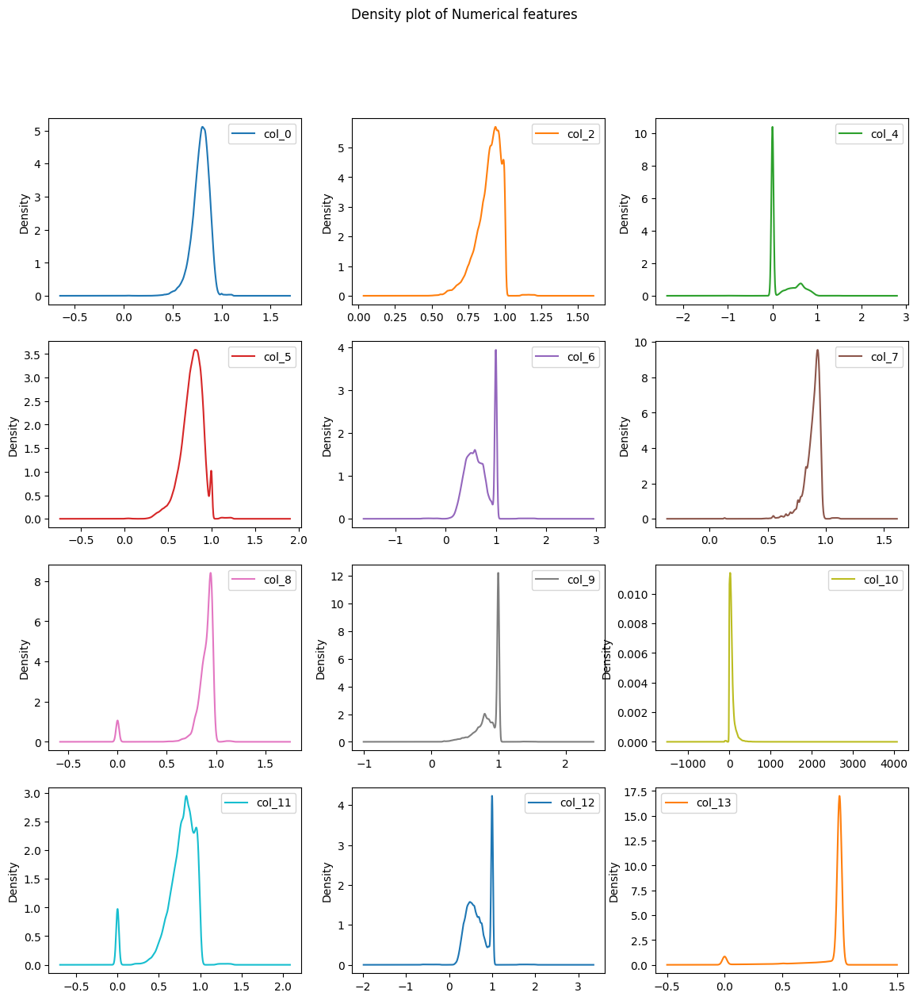

In [14]:
_ = (
    data[numerical_cols]
    .plot(kind='density', figsize=(14, 14), subplots=True, layout=(4,3),
          title="Density plot of Numerical features", sharex=False)
)

To sum up:
* Distributions of features are not normal. col_0 has distiribution which is the most closest to Normal.
* Distributions are skewed
* Some features have outliers (e.g col_10, col_13).

Let's take a look at categorical columns distributions

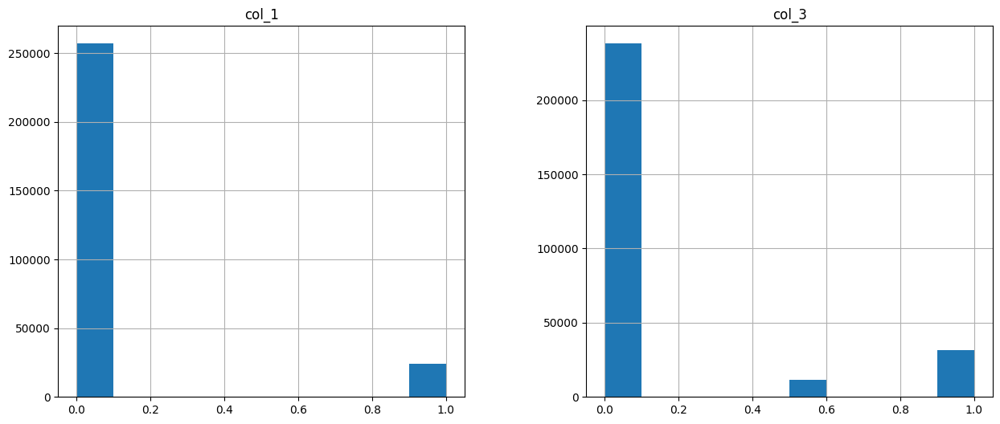

In [15]:
_ = data[cat_cols].hist(figsize=(15, 6))

To sum up:

* Categories are disbalanced with outbalancing number of samples in one of the categories.

Let's take a look at each feature in details

#### Col_0

In [16]:
feature = 'col_0'

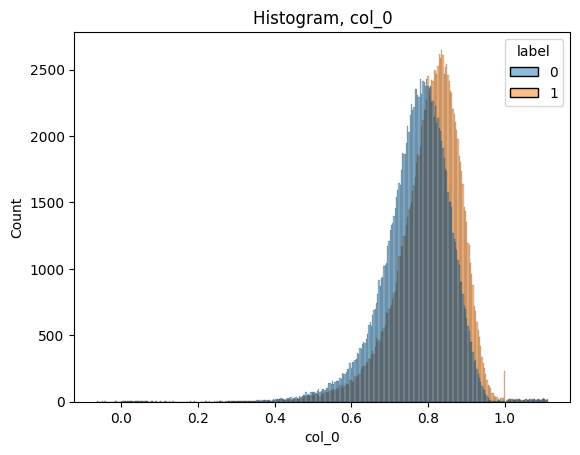

In [17]:
plt.figure()
sns.histplot(data, x=feature, hue='label')
plt.title(f'Histogram, {feature}')
plt.show()

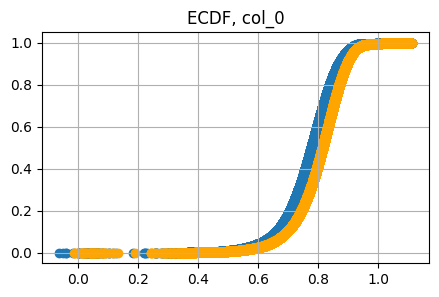

In [18]:
plot_ecdf(data, feature, 'label', title=f'ECDF, {feature}')

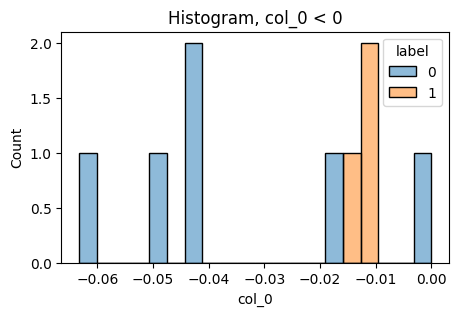

In [19]:
plt.figure(figsize=(5,3))
sns.histplot(data[data[feature] < 0], x=feature, hue='label', bins=20)
plt.title(f'Histogram, {feature} < 0')
plt.show()

In [20]:
data[data[feature] == 1]['label'].value_counts()

1    171
0      1
Name: label, dtype: int64

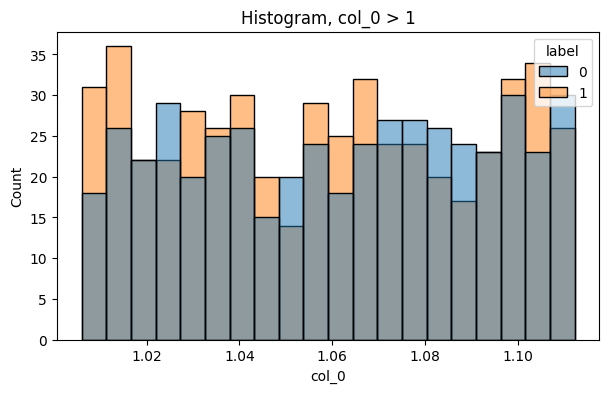

In [21]:
plt.figure(figsize=(7,4))
sns.histplot(data[data[feature] > 1], x=feature, hue='label', bins=20)
plt.title(f'Histogram, {feature} > 1')
plt.show()

In [22]:
data[data[feature] > 1].head(3)

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13,label,id
279006,1.019160,0,0.597802,0.0,-0.791548,1.203743,1.701048,1.101319,0.696221,1.489047,-102.852419,1.370704,-0.484708,1.0,1,279006
279009,1.014074,0,0.624840,0.0,1.451529,1.204520,-0.339339,1.116433,1.084106,1.375635,157.258621,0.237340,-0.318483,1.0,0,279009
279010,1.064594,0,1.166581,0.0,-0.950280,1.185832,-0.342564,1.060259,1.090586,0.294044,193.109109,1.239310,1.869930,1.0,1,279010


#### Col_1

In [23]:
feature = 'col_1'

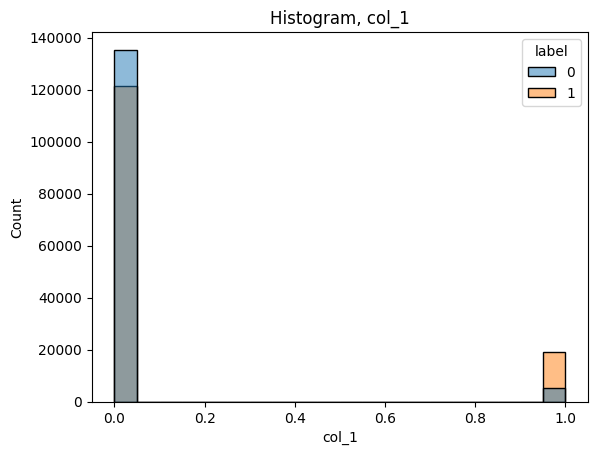

In [24]:
plt.figure()
sns.histplot(data, x=feature, hue='label')
plt.title(f'Histogram, {feature}')
plt.show()

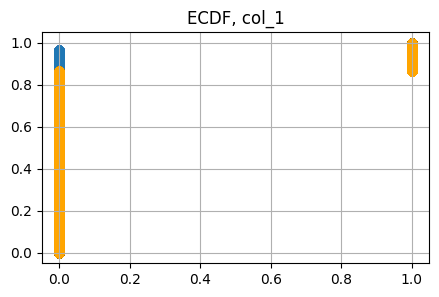

In [25]:
plot_ecdf(data, feature, 'label', title=f'ECDF, {feature}')

#### Col_2

In [26]:
feature = 'col_2'

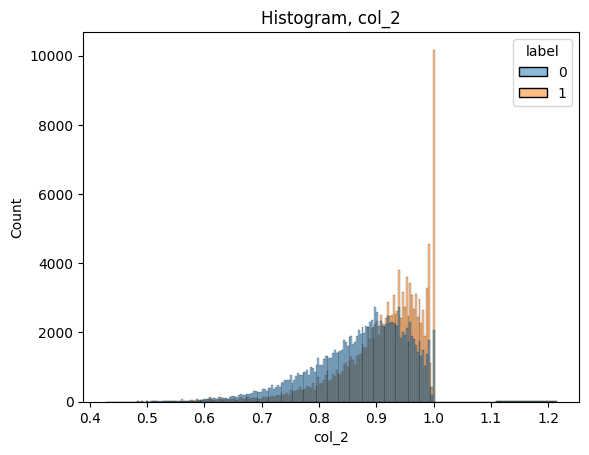

In [27]:
plt.figure()
sns.histplot(data, x=feature, hue='label')
plt.title(f'Histogram, {feature}')
plt.show()

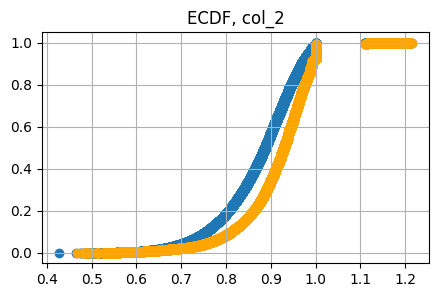

In [28]:
plot_ecdf(data, feature, 'label', title=f'ECDF, {feature}')

In [29]:
data[data[feature] == 1]['label'].value_counts()

1    10175
0     2073
Name: label, dtype: int64

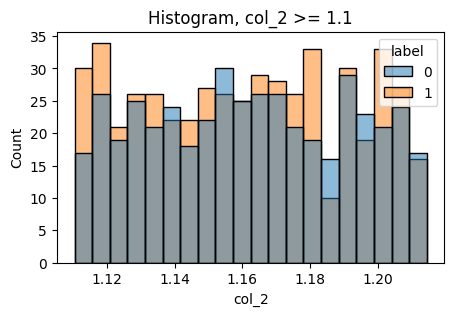

In [30]:
plt.figure(figsize=(5,3))
sns.histplot(data[data[feature] >= 1.1], x=feature, hue='label', bins=20)
plt.title(f'Histogram, {feature} >= 1.1')
plt.show()

In [31]:
data[data['col_2'] >= 1.1].head(4)

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13,label,id
279004,0.525364,0,1.202949,0.0,-0.837197,0.408473,1.534269,1.104454,1.098928,1.543530,-61.167023,1.198042,-0.264720,1.0,0,279004
279008,0.567579,0,1.195014,0.0,-1.021077,0.399645,1.742974,0.730979,0.656023,0.350165,189.576779,0.316289,-0.630213,1.0,1,279008
279010,1.064594,0,1.166581,0.0,-0.950280,1.185832,-0.342564,1.060259,1.090586,0.294044,193.109109,1.239310,1.869930,1.0,1,279010
279014,1.099703,0,1.187984,0.0,1.183775,0.383335,1.737141,0.681809,1.161548,0.364306,177.648278,0.239586,1.619700,1.0,0,279014


#### Col_3

In [32]:
feature = 'col_3'

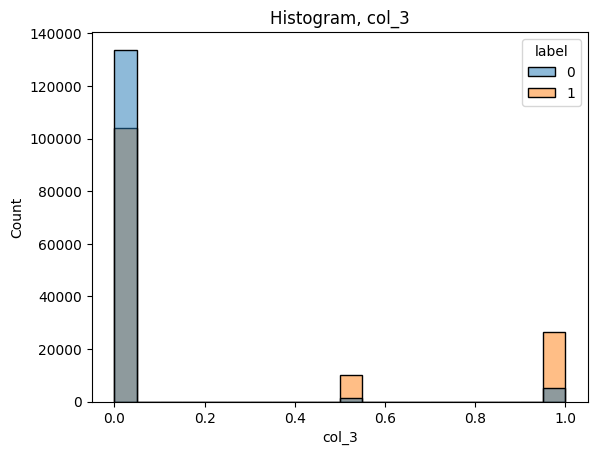

In [33]:
plt.figure()
sns.histplot(data, x=feature, hue='label')
plt.title(f'Histogram, {feature}')
plt.show()

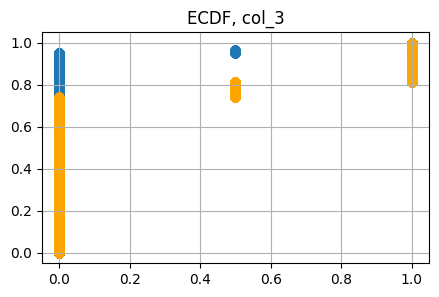

In [34]:
plot_ecdf(data, feature, 'label', title=f'ECDF, {feature}')

#### Col_4

In [35]:
feature = 'col_4'

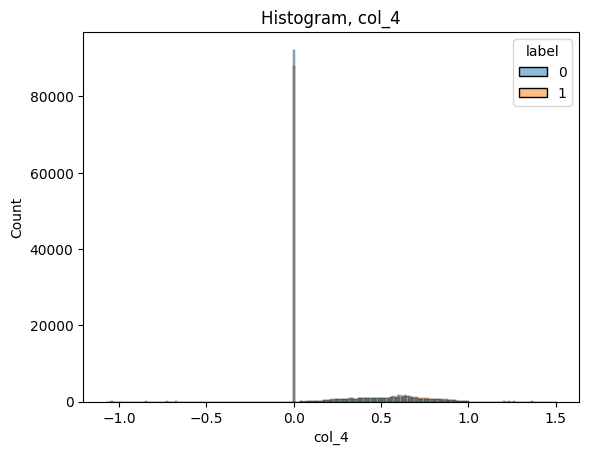

In [36]:
plt.figure()
sns.histplot(data, x=feature, hue='label')
plt.title(f'Histogram, {feature}')
plt.show()

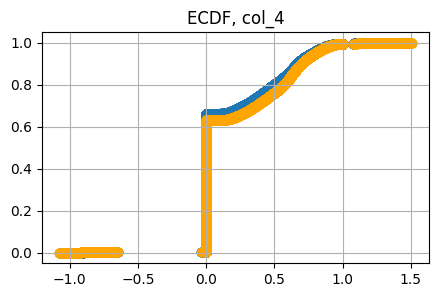

In [37]:
plot_ecdf(data, feature, 'label', title=f'ECDF, {feature}')

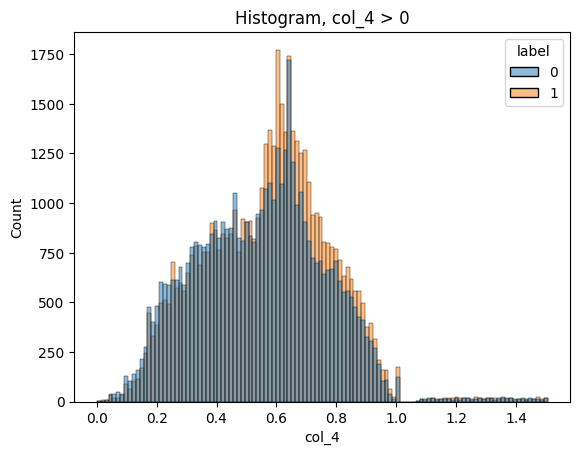

In [38]:
plt.figure()
sns.histplot(data[data[feature] > 0], x=feature, hue='label')
plt.title(f'Histogram, {feature} > 0')
plt.show()

Text(0.5, 1.0, 'Histogram, col_4 <= -0.5')

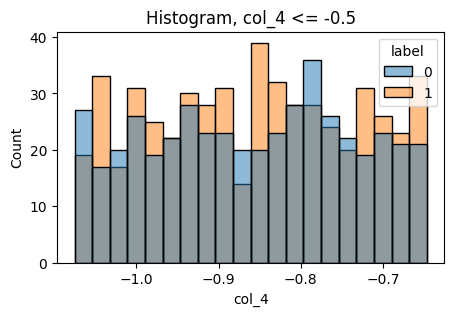

In [39]:
plt.figure(figsize=(5,3))
sns.histplot(data[data[feature] <= -0.5], x=feature, hue='label', bins=20)
plt.title(f'Histogram, {feature} <= -0.5')

In [40]:
data[data[feature] <= -0.5].head(3)

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13,label,id
279004,0.525364,0,1.202949,0.0,-0.837197,0.408473,1.534269,1.104454,1.098928,1.543530,-61.167023,1.198042,-0.264720,1.0,0,279004
279005,0.495256,0,0.614490,0.0,-0.666805,1.191575,-0.300738,1.055509,1.132561,0.368640,182.633522,0.289372,1.884965,1.0,1,279005
279006,1.019160,0,0.597802,0.0,-0.791548,1.203743,1.701048,1.101319,0.696221,1.489047,-102.852419,1.370704,-0.484708,1.0,1,279006


#### Col_5

In [41]:
feature = 'col_5'

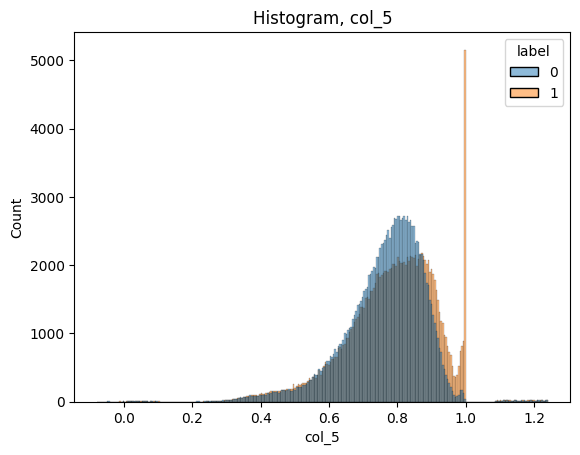

In [42]:
plt.figure()
sns.histplot(data, x=feature, hue='label')
plt.title(f'Histogram, {feature}')
plt.show()

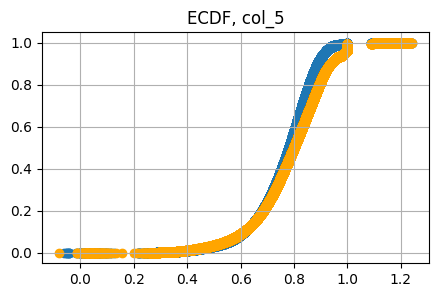

In [43]:
plot_ecdf(data, feature, 'label', title=f'ECDF, {feature}')

In [44]:
data[data[feature] == 1]['label'].value_counts()

1    3612
0      12
Name: label, dtype: int64

In [45]:
data[data[feature] > 1].head(3)

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13,label,id
279005,0.495256,0,0.614490,0.0,-0.666805,1.191575,-0.300738,1.055509,1.132561,0.368640,182.633522,0.289372,1.884965,1.0,1,279005
279006,1.019160,0,0.597802,0.0,-0.791548,1.203743,1.701048,1.101319,0.696221,1.489047,-102.852419,1.370704,-0.484708,1.0,1,279006
279007,0.568227,0,0.683189,0.0,-0.699732,1.232886,1.764034,1.108593,1.163239,1.376423,-62.149588,0.293257,1.856184,1.0,0,279007


#### Col_6

In [46]:
feature = 'col_6'

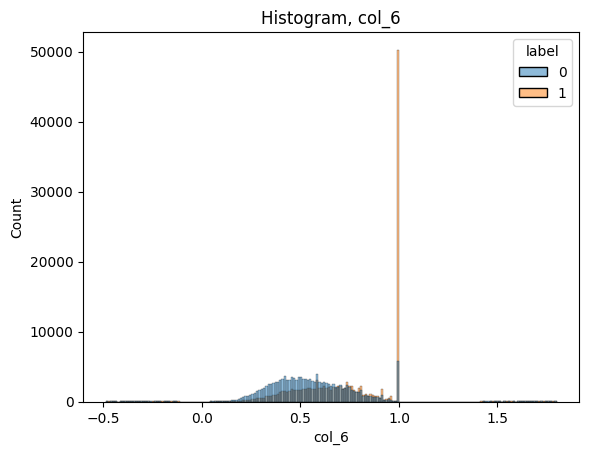

In [47]:
plt.figure()
sns.histplot(data, x=feature, hue='label')
plt.title(f'Histogram, {feature}')
plt.show()

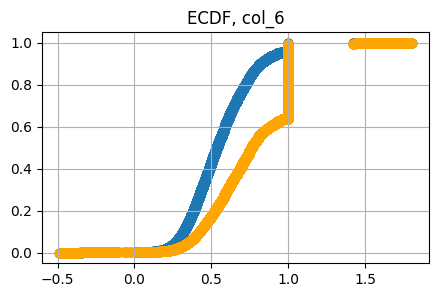

In [48]:
plot_ecdf(data, feature, 'label', title=f'ECDF, {feature}')

In [49]:
data[data[feature] == 1]['label'].value_counts()

1    50274
0     5734
Name: label, dtype: int64

In [50]:
data[data[feature] > 1].head(3)

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13,label,id
279004,0.525364,0,1.202949,0.0,-0.837197,0.408473,1.534269,1.104454,1.098928,1.543530,-61.167023,1.198042,-0.264720,1.0,0,279004
279006,1.019160,0,0.597802,0.0,-0.791548,1.203743,1.701048,1.101319,0.696221,1.489047,-102.852419,1.370704,-0.484708,1.0,1,279006
279007,0.568227,0,0.683189,0.0,-0.699732,1.232886,1.764034,1.108593,1.163239,1.376423,-62.149588,0.293257,1.856184,1.0,0,279007


#### Col_7

In [51]:
feature = 'col_7'

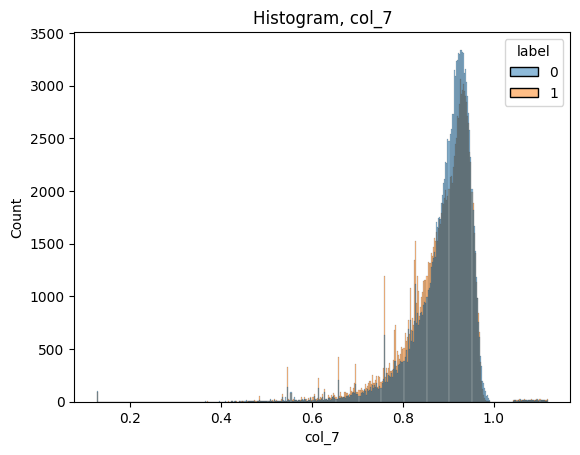

In [52]:
plt.figure()
sns.histplot(data, x=feature, hue='label')
plt.title(f'Histogram, {feature}')
plt.show()

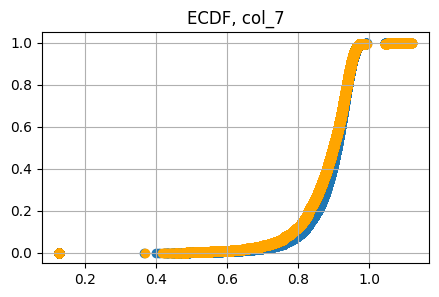

In [53]:
plot_ecdf(data, feature, 'label', title=f'ECDF, {feature}')

#### Col_8

In [54]:
feature = 'col_8'

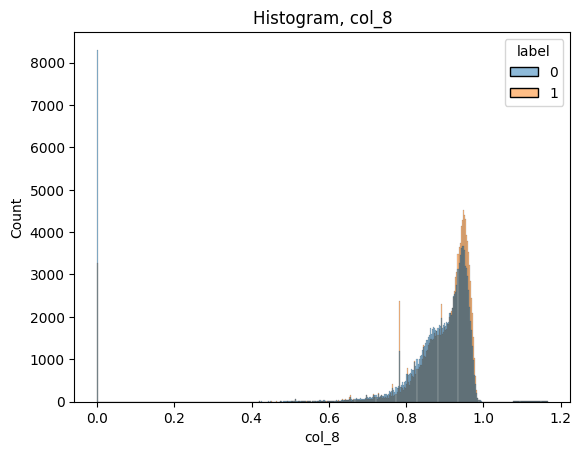

In [55]:
plt.figure()
sns.histplot(data, x=feature, hue='label')
plt.title(f'Histogram, {feature}')
plt.show()

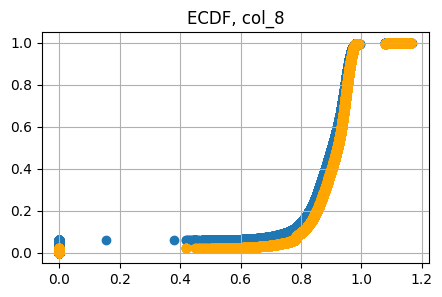

In [56]:
plot_ecdf(data, feature, 'label', title=f'ECDF, {feature}')

In [57]:
data[data[feature] == 0]['label'].value_counts()

0    8307
1    3267
Name: label, dtype: int64

#### Col_9

In [58]:
feature = 'col_9'

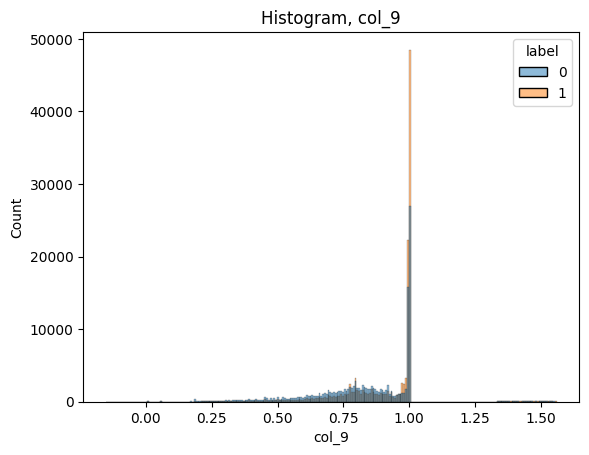

In [59]:
plt.figure()
sns.histplot(data, x=feature, hue='label')
plt.title(f'Histogram, {feature}')
plt.show()

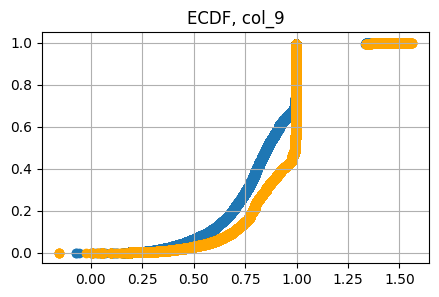

In [60]:
plot_ecdf(data, feature, 'label', title=f'ECDF, {feature}')

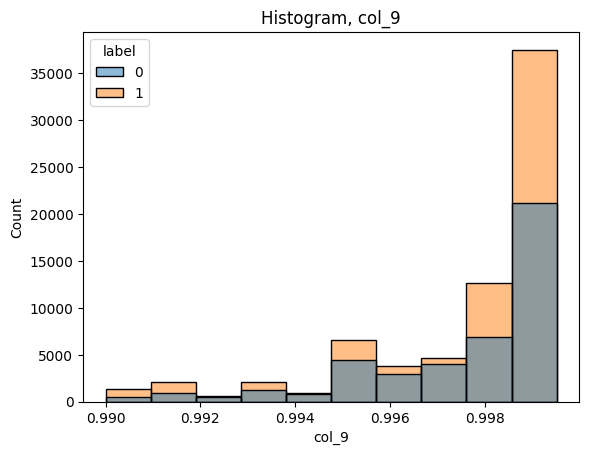

In [61]:
plt.figure()
sns.histplot(data[(data[feature] > .99) & (data[feature] < 1)], x=feature, hue='label', bins=10)
plt.title(f'Histogram, {feature}')
plt.show()

In [62]:
data[(data[feature] > .99) & (data[feature] < 1)]['label'].value_counts()

1    72193
0    43311
Name: label, dtype: int64

In [63]:
data[data[feature] > 1].head(3)

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13,label,id
279004,0.525364,0,1.202949,0.0,-0.837197,0.408473,1.534269,1.104454,1.098928,1.543530,-61.167023,1.198042,-0.264720,1.0,0,279004
279006,1.019160,0,0.597802,0.0,-0.791548,1.203743,1.701048,1.101319,0.696221,1.489047,-102.852419,1.370704,-0.484708,1.0,1,279006
279007,0.568227,0,0.683189,0.0,-0.699732,1.232886,1.764034,1.108593,1.163239,1.376423,-62.149588,0.293257,1.856184,1.0,0,279007


#### Col_10

In [64]:
feature = 'col_10'

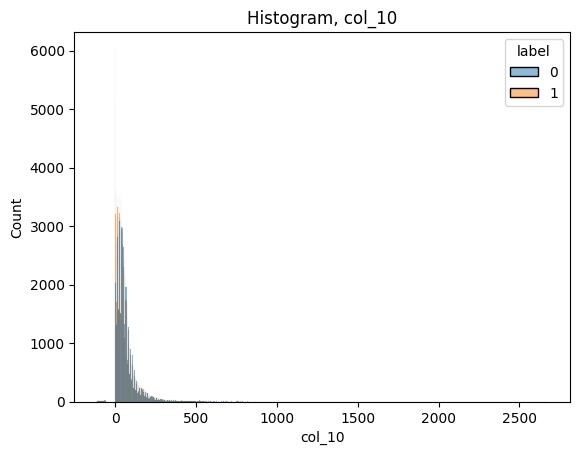

In [65]:
plt.figure()
sns.histplot(data, x=feature, hue='label')
plt.title(f'Histogram, {feature}')
plt.show()

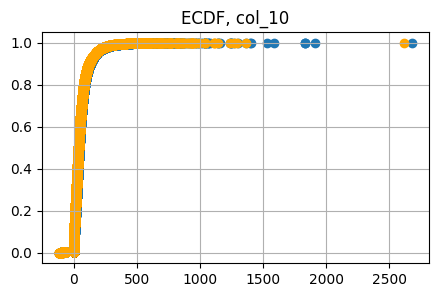

In [66]:
plot_ecdf(data, feature, 'label', title=f'ECDF, {feature}')

In [67]:
data[(data[feature] == 0)]['label'].value_counts()

1    6016
0    5173
Name: label, dtype: int64

Column is integer, however it become float starting from 279004th row
Also it's positive, however there are negative values starting with 279004th row

#### Col_11

In [68]:
feature = 'col_11'

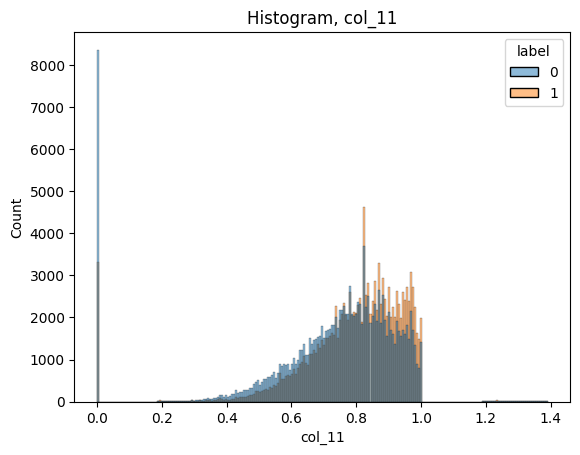

In [69]:
plt.figure()
sns.histplot(data, x=feature, hue='label')
plt.title(f'Histogram, {feature}')
plt.show()

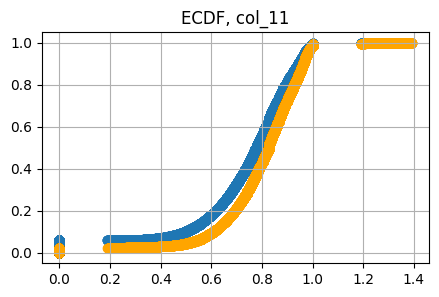

In [70]:
plot_ecdf(data, feature, 'label', title=f'ECDF, {feature}')

In [71]:
data[(data[feature] == 0)]['label'].value_counts()

0    8366
1    3328
Name: label, dtype: int64

In [72]:
data[(data[feature] > 1)].head(3)

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13,label,id
279004,0.525364,0,1.202949,0.0,-0.837197,0.408473,1.534269,1.104454,1.098928,1.543530,-61.167023,1.198042,-0.264720,1.0,0,279004
279006,1.019160,0,0.597802,0.0,-0.791548,1.203743,1.701048,1.101319,0.696221,1.489047,-102.852419,1.370704,-0.484708,1.0,1,279006
279010,1.064594,0,1.166581,0.0,-0.950280,1.185832,-0.342564,1.060259,1.090586,0.294044,193.109109,1.239310,1.869930,1.0,1,279010


#### Col_12

In [73]:
feature = 'col_12'

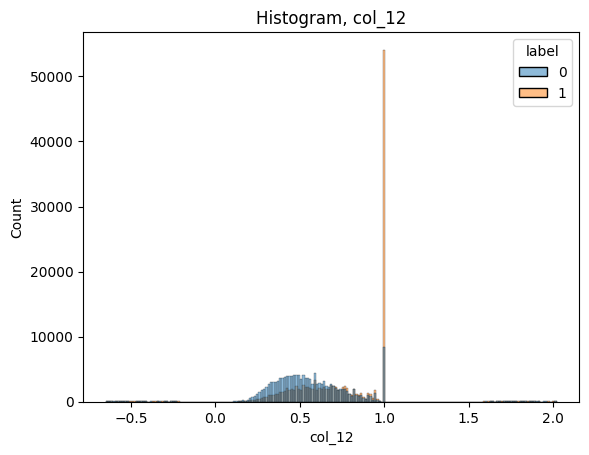

In [74]:
plt.figure()
sns.histplot(data, x=feature, hue='label')
plt.title(f'Histogram, {feature}')
plt.show()

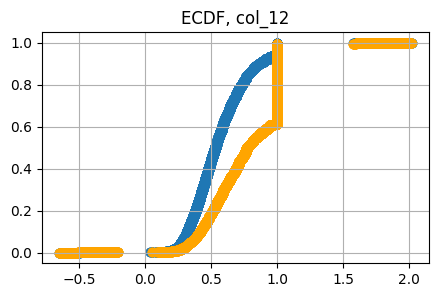

In [75]:
plot_ecdf(data, feature, 'label', title=f'ECDF, {feature}')

In [76]:
data[(data[feature] == 1)]['label'].value_counts()

1    54132
0     8318
Name: label, dtype: int64

In [77]:
data[(data[feature] > 1)].head(3)

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13,label,id
279005,0.495256,0,0.614490,0.0,-0.666805,1.191575,-0.300738,1.055509,1.132561,0.368640,182.633522,0.289372,1.884965,1.0,1,279005
279007,0.568227,0,0.683189,0.0,-0.699732,1.232886,1.764034,1.108593,1.163239,1.376423,-62.149588,0.293257,1.856184,1.0,0,279007
279010,1.064594,0,1.166581,0.0,-0.950280,1.185832,-0.342564,1.060259,1.090586,0.294044,193.109109,1.239310,1.869930,1.0,1,279010


In [78]:
data[(data[feature] < 0)].head(3)

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13,label,id
279004,0.525364,0,1.202949,0.0,-0.837197,0.408473,1.534269,1.104454,1.098928,1.543530,-61.167023,1.198042,-0.264720,1.0,0,279004
279006,1.019160,0,0.597802,0.0,-0.791548,1.203743,1.701048,1.101319,0.696221,1.489047,-102.852419,1.370704,-0.484708,1.0,1,279006
279008,0.567579,0,1.195014,0.0,-1.021077,0.399645,1.742974,0.730979,0.656023,0.350165,189.576779,0.316289,-0.630213,1.0,1,279008


#### Col_13

In [79]:
feature = 'col_13'

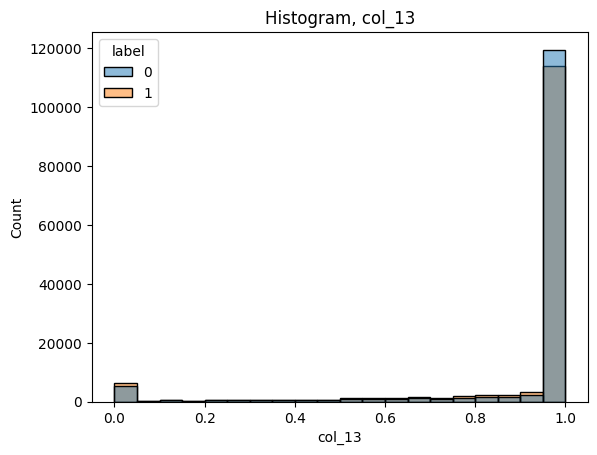

In [80]:
plt.figure()
sns.histplot(data, x=feature, hue='label')
plt.title(f'Histogram, {feature}')
plt.show()

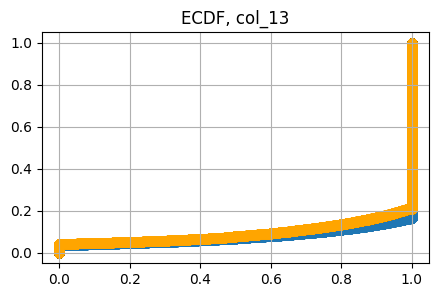

In [81]:
plot_ecdf(data, feature, 'label', title=f'ECDF, {feature}')

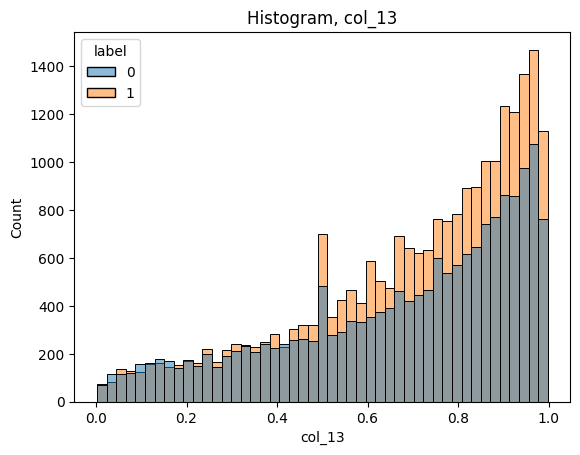

In [82]:
plt.figure()
sns.histplot(data[(data[feature] > 0) & (data[feature] < 1)], x=feature, hue='label')
plt.title(f'Histogram, {feature}')
plt.show()

To sum up:
- Distributions are skewed
- There are bins with prevailing number of positive or negative label in distributions of certain features. For example, when col_2 equals to 1, the ratio of labels is 5:1. When col_5 equals to 1, the ratio of labels is 300:1. When col_12 equals to 1, the ratio of labels is 6:1.
- Data samples have different distribution starting with 279004th row in table. For example, col_10 is integer, however it become float starting with 279004th row. Also it's positive, however there are negative values starting with 279004th row. Also most features values lie in [0, 1] interval before 279004th row, and start going out of bounds starting with 279004th row (e.g. col_6, col_9, col_11, col_12)

## 2. Features interactions

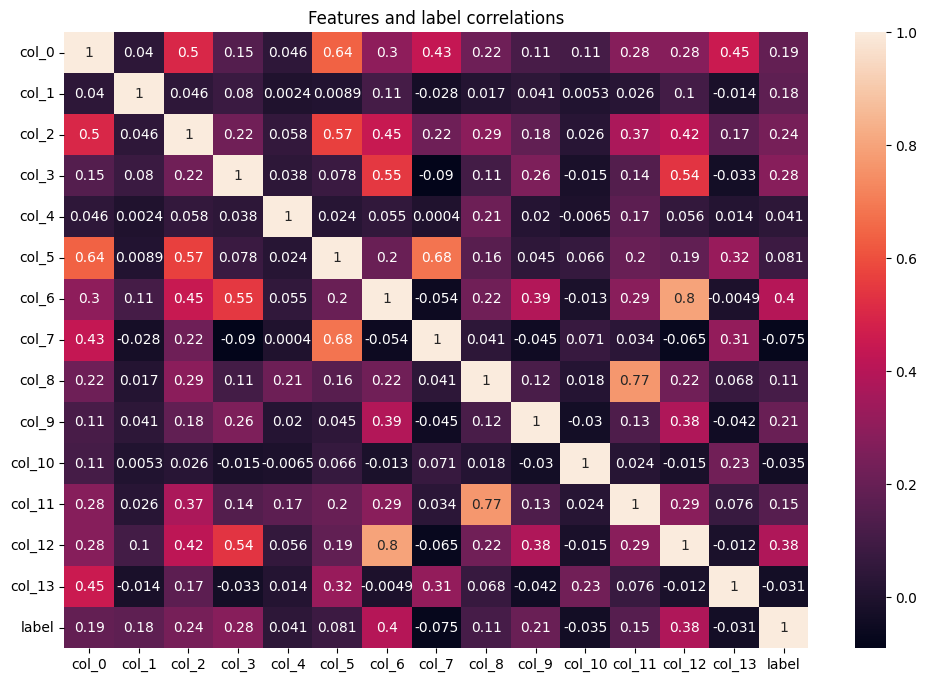

In [83]:
plt.figure(figsize=((12, 8)))
plt.title('Features and label correlations')
sns.heatmap(data[features+['label']].corr(), annot=True)
plt.show()

- There is no strong correlation between features, except following pairs: <br>
(col_2, col_0), (col_5, col_0), (col_5, col_3),
(col_6, col_2), (col_6, col_3), (col_7, col_5),
(col_11, col_8), (col_12, col_3), (col_12, col_6)
- Label has the strongest correlation with following features: <br>
col_6, col_12, col_3, col_2, col_9

Let's look at columns pairplots

In [ ]:
plt.figure()
sns.pairplot(data)
# plt.savefig('img/pairplot.png')

In [6]:
Image(filename='img/pairplot.png', width=1100)

There are interesting 4 clusters at the corners of several pairplots. Let's look closely at interactions between some subset of features and target.

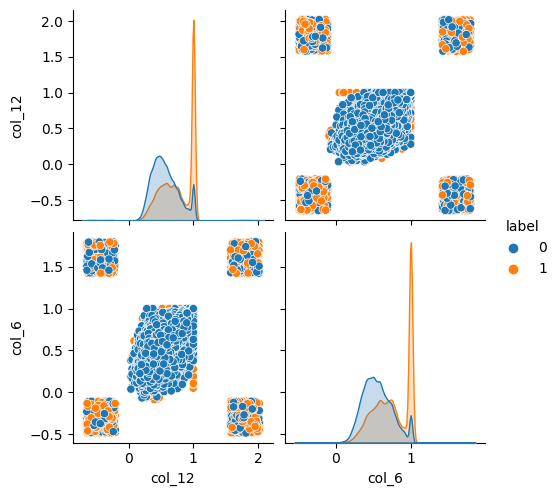

In [84]:
sns.pairplot(data[['col_12', 'col_6', 'label']], hue='label')

Middle cluster

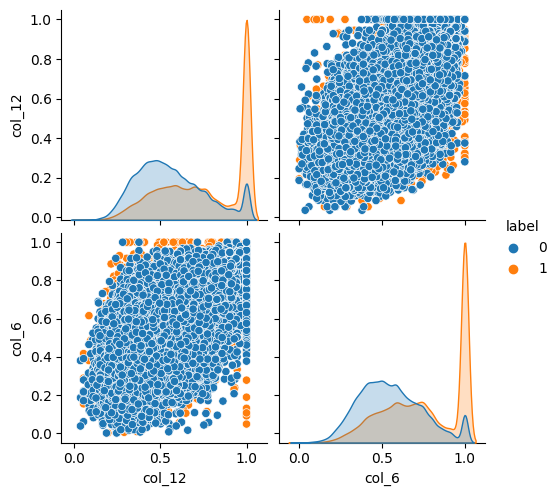

In [85]:
sample = data[(data.col_12 >= 0) & (data.col_12 <= 1) & (data.col_6 >= 0) & (data.col_6 <= 1)]

sns.pairplot(sample[['col_12', 'col_6', 'label']], hue='label')

Lower left cluster

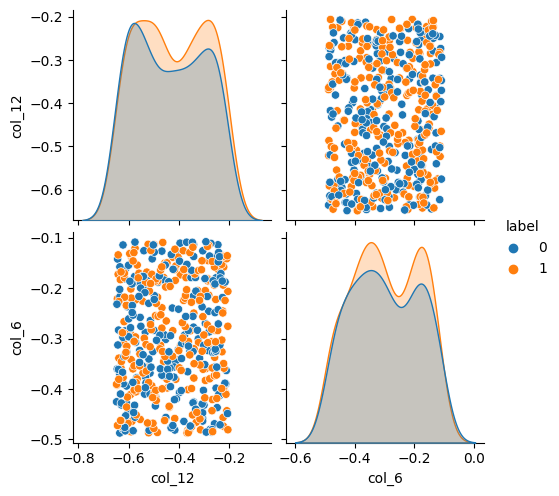

In [86]:
sample = data[(data.col_12 < 0) & (data.col_6 < 0)]

sns.pairplot(sample[['col_12', 'col_6', 'label']], hue='label')

Another subset

In [ ]:
plt.figure()
sns.pairplot(data[['col_0', 'col_4', 'col_6', 'label']], hue='label')
plt.title('Pairplot')
plt.show()

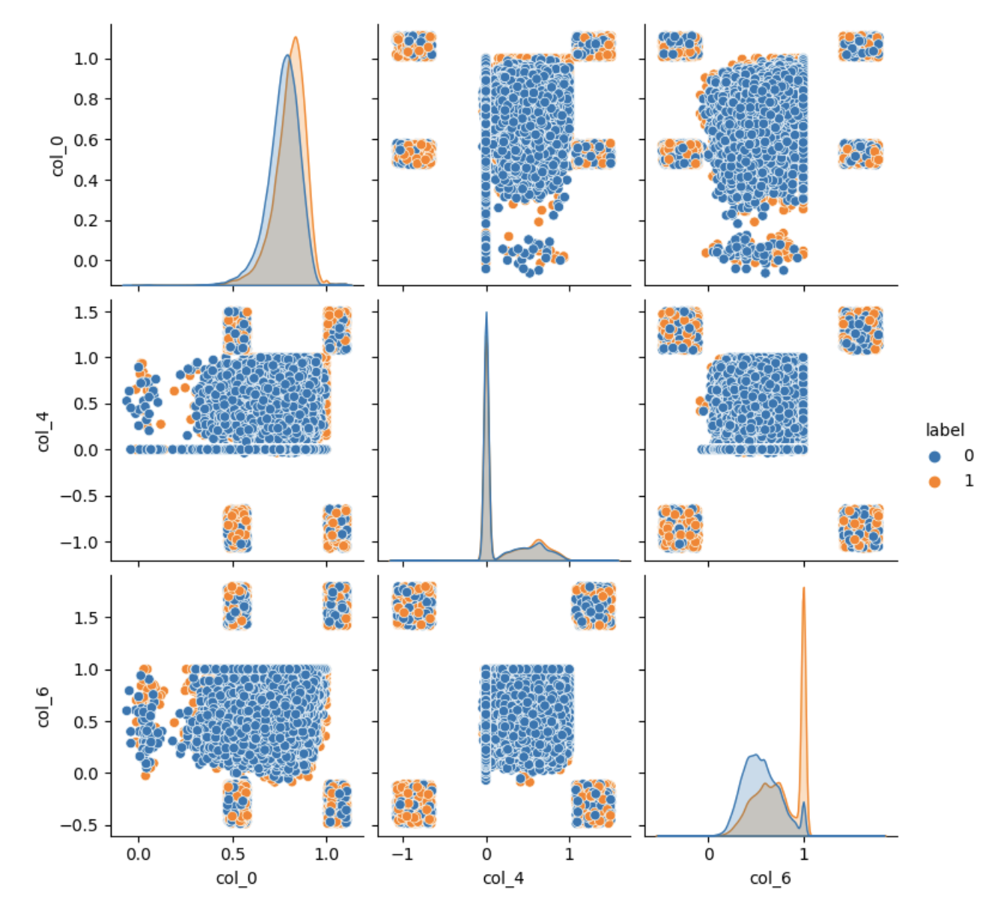

In [2]:
Image(filename='img/pairplot1.png', width=600)

Let's see if we can distinguish labels by this features subset

In [88]:
xs0 = data[data.label==0].col_0.values
ys0 = data[data.label==0].col_4.values
zs0 = data[data.label==0].col_6.values

xs1 = data[data.label==1].col_0.values
ys1 = data[data.label==1].col_4.values
zs1 = data[data.label==1].col_6.values

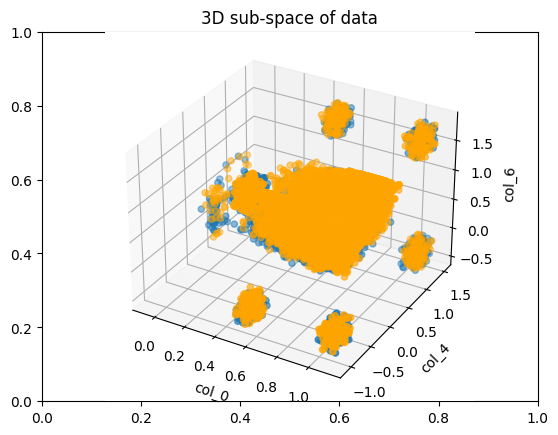

In [89]:
plt.figure()
plt.title('3D sub-space of data')
ax = plt.axes(projection='3d')
ax.scatter3D(xs0, ys0, zs0)
ax.scatter3D(xs1, ys1, zs1, color='orange')
ax.set_xlabel('col_0')
ax.set_ylabel('col_4')
ax.set_zlabel('col_6')
plt.show()

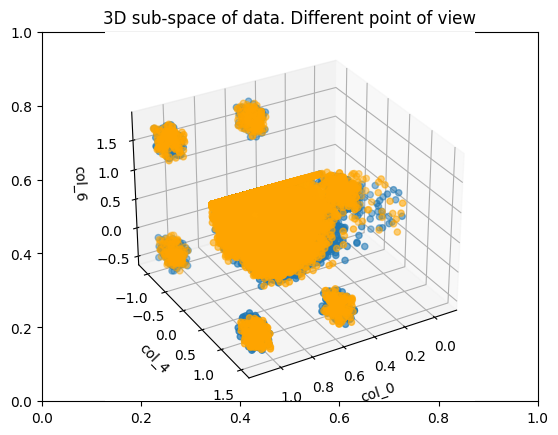

In [90]:
plt.figure()
plt.title('3D sub-space of data. Different point of view')
ax = plt.axes(projection='3d')
ax.scatter3D(xs0, ys0, zs0)
ax.scatter3D(xs1, ys1, zs1, color='orange')
ax.set_xlabel('col_0')
ax.set_ylabel('col_4')
ax.set_zlabel('col_6')
ax.azim = 60
plt.show()

No we can't

Check if strange 4 cluster on the corners came from samples starting with 279004th row

In [ ]:
plt.figure()
sns.pairplot(
    data=data.loc[data['id'] < 279004, ['col_0', 'col_4', 'col_6', 'label']],
    hue='label',
)
plt.title('Pairplot. Data sample before 279004th row')
plt.show()

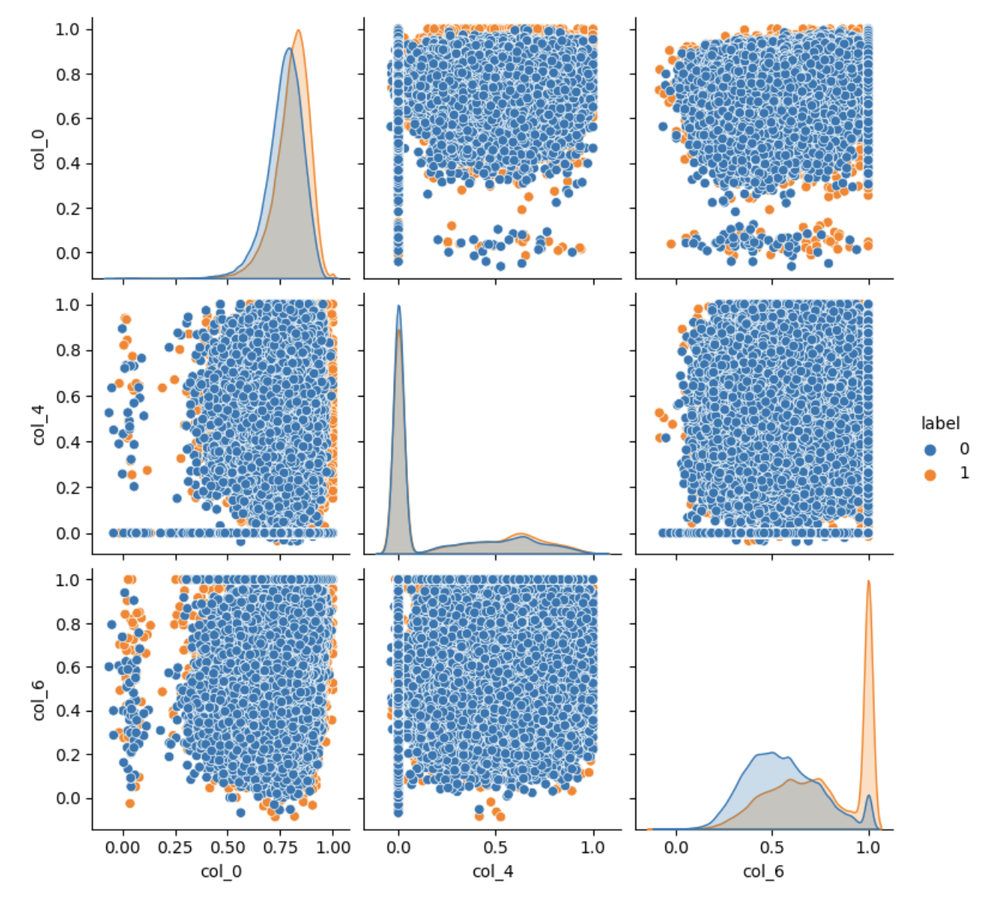

In [7]:
Image(filename='img/pairplot2.png', width=600)

Confirmed. Maybe we should process samples before 279004th row and after separately. They came from different distributions.

That could be breakdown of equipment that reads and saves the signal, if this data came from some technical domain. Or it could be bug in scripts that gather user clicks, sessions and other metrics, if the data came from web analitics domain.

Anyway, it's very strange behaviour, and I would ask questions to business people.

### Time Series

What if each columns is a timestamp and dataset is Time Series data?

Data standartization

In [93]:
data_ts = data.copy()

for col in features:
    data_ts[col] = (data_ts[col] - data_ts[col].mean()) / data_ts[col].std()

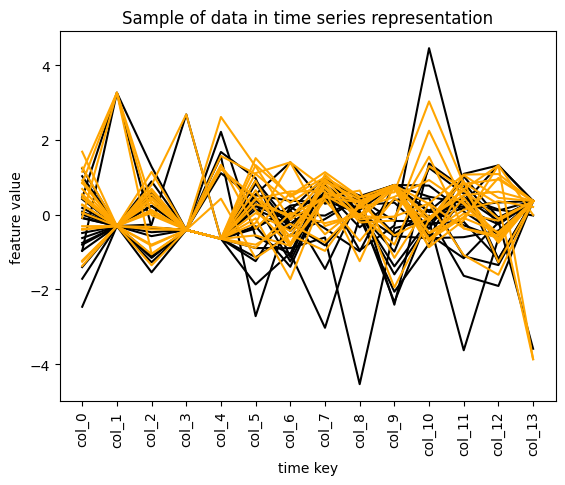

In [94]:
sample_neg = data_ts[data_ts.label == 0][features].sample(20).T
sample_pos = data_ts[data_ts.label == 1][features].sample(20).T

plt.figure()
plt.xticks(rotation=90)
plt.title('Sample of data in time series representation')
plt.ylabel('feature value')
plt.xlabel('time key')

for xs in sample_neg:
    plt.plot(sample_neg[xs], color='black')

for xs in sample_pos:
    plt.plot(sample_pos[xs], color='orange')

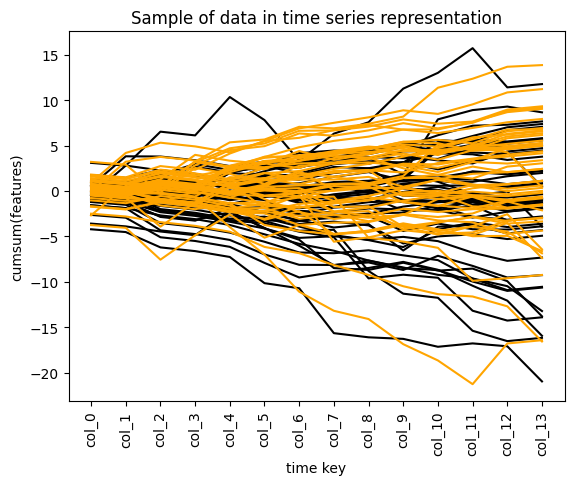

In [95]:
data_cumsum = data_ts[features].cumsum(axis=1)
data_cumsum['label'] = data_ts['label']

sample_neg = data_cumsum[data_cumsum.label == 0][features].sample(50).T
sample_pos = data_cumsum[data_cumsum.label == 1][features].sample(50).T

plt.xticks(rotation=90)
plt.title('Sample of data in time series representation')
plt.ylabel('cumsum(features)')
plt.xlabel('time key')

for xs in sample_neg:
    plt.plot(sample_neg[xs], color='black')

for xs in sample_pos:
    plt.plot(sample_pos[xs], color='orange')

Based on the plot, the cumulative sum of features has a positive trend for positive label in average, and negative trend for negative label.

Maybe sum of all features would be a good feature

### Dataset Visualization

Let's visualize the dataset using PCA

In [96]:
decompositor = Pipeline([('scaler', StandardScaler()), ('pca', PCA(n_components=2))])
components = decompositor.fit_transform(data[features].values)

In [ ]:
plt.figure(figsize=(11, 11))

plt.scatter(components[:, 0], components[:, 1], c=data.label.values)
plt.gca()
plt.xlabel('PC1')
plt.ylabel('PC2')
# plt.savefig('pca.png')

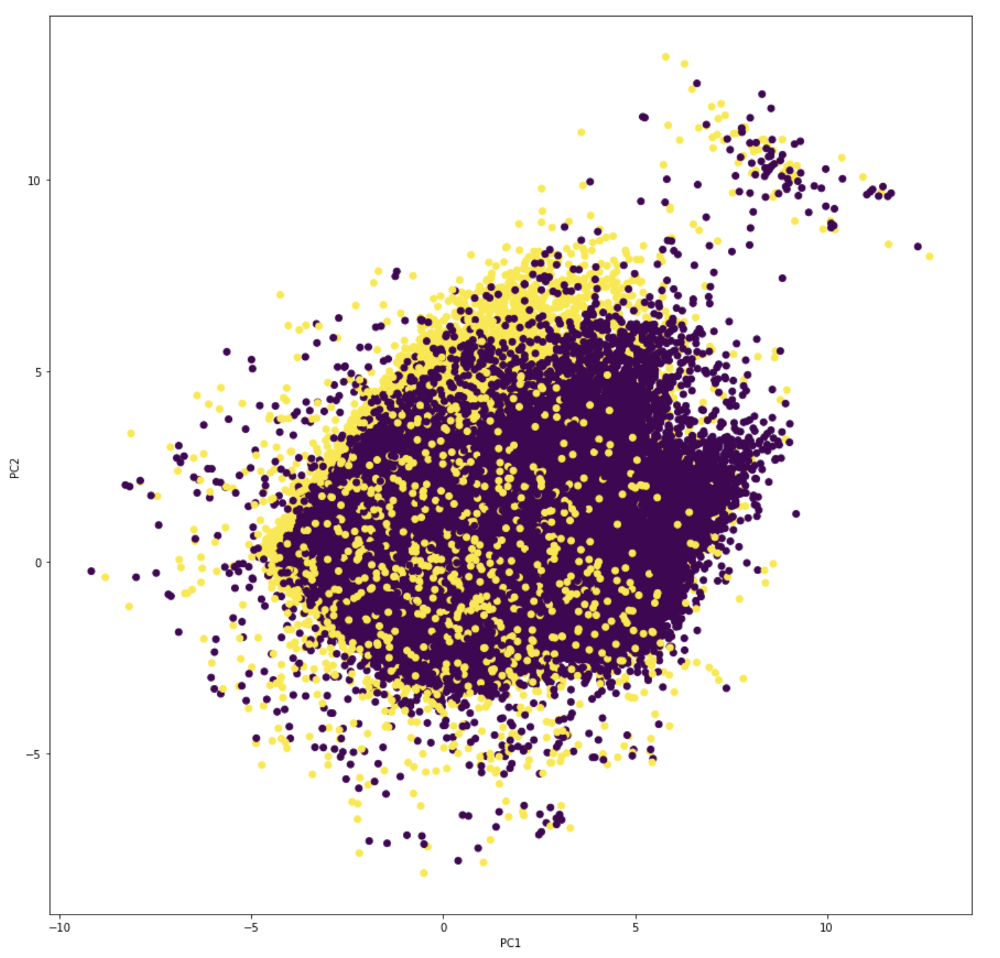

In [23]:
Image(filename='img/pca.png', width=600)

There is no linear separation of classes. Moreover, there is a dense overlap of class objects.

## 3. Feature Engineering

1. As we saw above, the sample is not linearly separable for the current feature space. Probably, the separation of two classes will be observed in the presence of quadratic (squaring features) and cross (multiplication of both real features among themselves, and real features with categorical) features.
2. Also, we can emphasize drastic disbalance of classes in some bins of certain features by making binary feature that equals to 1, if value lies in bin.
3. Let's emphasize "suspicious" objects that lie out of [0, 1] interval.


In [98]:
data = calc_sq_features(data, numerical_cols)
data = calc_mult_features(data, numerical_cols)

data = calc_feature_eq_val(data, 'col_0', 1)
data = calc_feature_eq_val(data, 'col_2', 1)
data = calc_feature_eq_val(data, 'col_5', 1)
data = calc_feature_eq_val(data, 'col_6', 1)
data = calc_feature_eq_val(data, 'col_8', 0)
data = calc_feature_eq_val(data, 'col_11', 0)
data = calc_feature_eq_val(data, 'col_12', 1)

data = calc_feature_between_vals(data, 'col_9', .99, 1)

data['features_sum'] = data[features].sum(axis=1)

for feature in numerical_cols:
    data = calc_feature_out_bounds(data, feature, 0, 1)

## 4. Feature Significance

Correlations matrix before feature generation:

In [99]:
data[features+['label']].corr()['label'].sort_values(ascending=False)[:10]

label     1.000000
col_6     0.399639
col_12    0.381644
col_3     0.280728
col_2     0.238474
col_9     0.207069
col_0     0.190756
col_1     0.178260
col_11    0.154521
col_8     0.110710
Name: label, dtype: float64

Correlations matrix after feature generation:

In [100]:
features_new = list(data.drop(columns=['id', 'label']).columns)
data[features_new+['label']].corr()['label'].sort_values(ascending=False)[:10]

label                  1.000000
mult__col_6__col_12    0.406659
mult__col_2__col_6     0.403752
col_6__sq              0.403120
mult__col_0__col_6     0.401104
col_6                  0.399639
col_6__eq_1            0.396609
mult__col_6__col_9     0.395024
col_12__eq_1           0.391979
mult__col_2__col_12    0.389249
Name: label, dtype: float64

We got sligh improvement in correlation with target

Let's leave top features by correlation with target

In [101]:
features_top_by_corr = select_features_by_corr(data, features_new, 'label', top=.5)

## 6. Model Building and Evaluation

1) Target label is balanced, so we can use accuracy as a metric for measuring model's perfomance.
2) Let's split dataset into train and test sets. We will tune the model using cross-validation on the train part of the data, and measure the final perfomance on the test set to understand model's generalization capacity.
3) We saw that ratio of positive or negative label prevails for certain feature, so models based on trees or nearest neighbours should be better for this problem, because they split all the space into sub-space and assign prevailing label to it.

$$ accuracy = {TP + TN \over TP + TN + FN + FP} $$

Train-test split with 70:30 ratio

In [102]:
test_ratio = .7

test_mask = np.random.randn(data.shape[0]) > test_ratio

#### Baseline approach

Using initial unprocessed features and mentioned above models.

In [103]:
X_train = data[~test_mask][features].values
y_train = data[~test_mask]['label'].values

In [104]:
models = {
    'knn: 5': Pipeline([('scaler', StandardScaler()), ('knn', KNeighborsClassifier(5))]),
    'knn: 10': Pipeline([('scaler', StandardScaler()), ('knn', KNeighborsClassifier(10))]),
    'knn: 100': Pipeline([('scaler', StandardScaler()), ('knn', KNeighborsClassifier(100))]),
    'rf: 50': RandomForestClassifier(50),
    'rf: 100': RandomForestClassifier(50),
    'gb: 100': lgb.LGBMClassifier(),
}

In [105]:
for name, model in models.items():
    cv = cross_val_score(
        model,
        X_train,
        y_train,
        scoring=make_scorer(accuracy_score),
        cv=3
    )
    cv_mean = round(cv.mean(), 4)
    cv_std = round(cv.std(), 4)
    print(f'{name}\t{cv_mean} +/- {cv_std}')

knn: 5	0.6828 +/- 0.0018
knn: 10	0.6979 +/- 0.0028
knn: 100	0.7093 +/- 0.0025
rf: 50	0.7205 +/- 0.0031
rf: 100	0.7199 +/- 0.0032
gb: 100	0.7208 +/- 0.0047


Gradient boosting trees model have showed the best perfomance on cross-validation. Let's use this kind of models for the next experiments.

#### Top features by correlation with target

In [106]:
X_train = data[~test_mask][features_top_by_corr].values

In [107]:
cv = cross_val_score(
    lgb.LGBMClassifier(),
    X_train,
    y_train,
    scoring=make_scorer(accuracy_score),
    cv=3
)
cv_mean = round(cv.mean(), 4)
cv_std = round(cv.std(), 4)
print(f'{cv_mean} +/- {cv_std}')

0.7165 +/- 0.0048


#### All prepared features

In [108]:
X_train = data[~test_mask][features_new].values

In [109]:
cv = cross_val_score(
    lgb.LGBMClassifier(),
    X_train,
    y_train,
    scoring=make_scorer(accuracy_score),
    cv=3
)
cv_mean = round(cv.mean(), 4)
cv_std = round(cv.std(), 4)
print(f'{cv_mean} +/- {cv_std}')

0.7197 +/- 0.0054


#### Final evaluation

Let's train the model with this many trees until the perfomance on validation set stops improving

Split train data into train and validation sets with ratio 80:20

In [117]:
X_train, X_val, y_train, y_val = train_test_split(
    data[~test_mask][features_new],
    data[~test_mask]['label'],
    test_size=0.2,
)
d_train = lgb.Dataset(X_train, label=y_train)
d_val = lgb.Dataset(X_val, label=y_val)

In [121]:
params = {
    "max_bin": 512,
    "learning_rate": 0.05,
    "boosting_type": "gbdt",
    "objective": "binary",
    "metric": "binary_logloss",
    "num_leaves": 10,
    "verbose": -1,
    "min_data": 100,
    "boost_from_average": True
}

model = lgb.train(params, d_train, 10000, valid_sets=[d_val], early_stopping_rounds=50, verbose_eval=1000)

Training until validation scores don't improve for 50 rounds
[1000]	valid_0's binary_logloss: 0.534139
Early stopping, best iteration is:
[1716]	valid_0's binary_logloss: 0.532664


In [ ]:
plot_feature_importance_weight(
    model,
    figsize=(7, 5),
    top_n=20,
    title='Top-20 Features Importance'
)

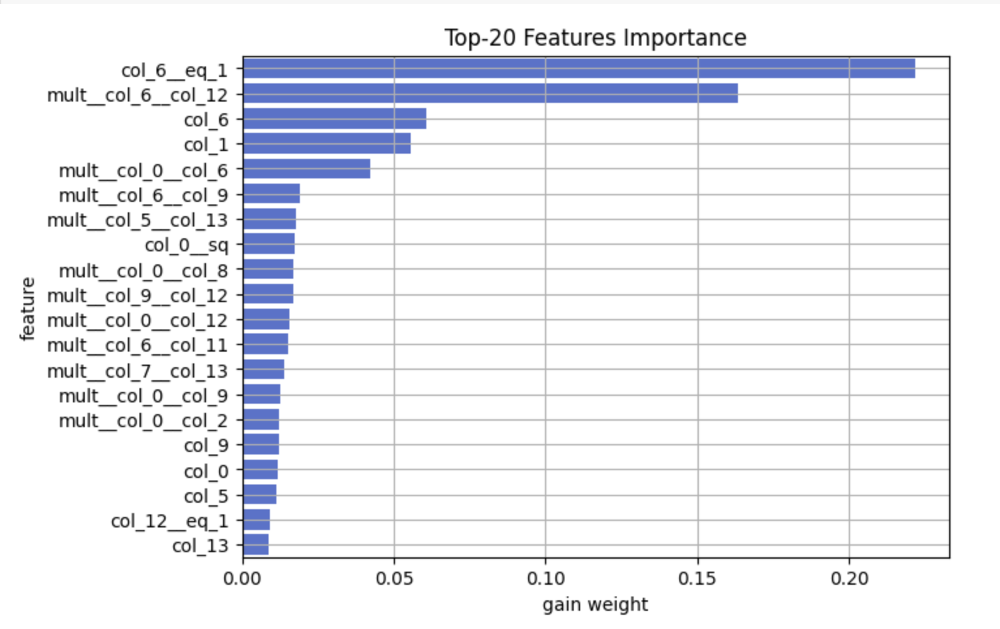

In [5]:
Image(filename='img/feature_importance.png', width=700)

1. We can see that top1 feature by gain improvement is a flag that col_6 equals to 1, because there is a 9:1 ratio of classes at this bin.
2. There are many multiplication features in the top, because they have better correlation with target.

Let's check model's perfomance on the unseen dataset

In [124]:
X_test = data[test_mask][features_new].values
y_test = data[test_mask]['label'].values

In [127]:
y_test_pred = model.predict(X_test)
y_test_pred = (y_test_pred > .5).astype(int)

final_score = accuracy_score(y_test, y_test_pred)
final_score = round(final_score*100, 2)
print(f'Final accuracy: {final_score}%')

Final accuracy: 72.72%


Final score is slightly better that cross-validation score. This is a sign that model isn't overfitted, and has a good generalization ability.